# **Introduction**

In this assignment, we explore the trade-offs between the simplicity of a decision tree and the predictive power of a random forest. While random forests typically outperform individual decision trees in terms of accuracy, they are computationally more intensive and harder to interpret. This makes the decision of which model to use dependent on the specific context and requirements of the task.

The dataset used in this study is a subset of New York State high school graduation data from the 2018-2019 academic year, containing over 73,000 observations. The data includes information on school districts, student subgroupings, and their academic outcomes, such as graduation rates and diploma types. Our goal is to build and compare the performance of a decision tree and a random forest model in predicting a categorical target variable derived from the percentage of students awarded "Regents" diplomas (reg_pct).

# **Importing Libraries**

In [1]:
# importing all the necessary libraries required -meher
import pandas as pd, numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import missingno as mno
import warnings
warnings.filterwarnings('ignore')
from scipy import stats
from sklearn.preprocessing import MinMaxScaler

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score
from sklearn.feature_selection import SelectKBest, mutual_info_classif

from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz


In [2]:
# -vedant
df = pd.read_csv('https://raw.githubusercontent.com/meher646/DAV-6150-2/refs/heads/main/M11_Data.csv')
df

,report_school_year,aggregation_index,aggregation_type,aggregation_name,nrc_code,nrc_desc,county_code,county_name,nyc_ind,membership_desc,subgroup_code,subgroup_name,enroll_cnt,grad_cnt,grad_pct,reg_cnt,reg_pct,dropout_cnt,dropout_pct
0,2018-19,3,District,ALBANY CITY SCHOOL DISTRICT,3,Urban-Suburban High Needs,1,ALBANY,0,2013 Total Cohort - 6 Year Outcome,1,All Students,658,464,71%,310,47%,148,22%
1,2018-19,3,District,ALBANY CITY SCHOOL DISTRICT,3,Urban-Suburban High Needs,1,ALBANY,0,2013 Total Cohort - 6 Year Outcome,2,Female,324,246,76%,169,52%,65,20%
2,2018-19,3,District,ALBANY CITY SCHOOL DISTRICT,3,Urban-Suburban High Needs,1,ALBANY,0,2013 Total Cohort - 6 Year Outcome,3,Male,334,218,65%,141,42%,83,25%
3,2018-19,3,District,ALBANY CITY SCHOOL DISTRICT,3,Urban-Suburban High Needs,1,ALBANY,0,2013 Total Cohort - 6 Year Outcome,4,American Indian/Alaska Native,-,-,-,-,-,-,-
4,2018-19,3,District,ALBANY CITY SCHOOL DISTRICT,3,Urban-Suburban High Needs,1,ALBANY,0,2013 Total Cohort - 6 Year Outcome,5,Black,367,248,68%,183,50%,91,25%
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73147,2018-19,3,District,DUNDEE CENTRAL SCHOOL DISTRICT,4,Rural High Needs,68,YATES,0,2013 Total Cohort - 6 Year Outcome - August 2019,18,Not Migrant,-,-,-,-,-,-,-
73148,2018-19,3,District,DUNDEE CENTRAL SCHOOL DISTRICT,4,Rural High Needs,68,YATES,0,2013 Total Cohort - 6 Year Outcome - August 2019,20,Homeless,-,-,-,-,-,-,-
73149,2018-19,3,District,DUNDEE CENTRAL SCHOOL DISTRICT,4,Rural High Needs,68,YATES,0,2013 Total Cohort - 6 Year Outcome - August 2019,21,Not Homeless,-,-,-,-,-,-,-
73150,2018-19,3,District,DUNDEE CENTRAL SCHOOL DISTRICT,4,Rural High Needs,68,YATES,0,2013 Total Cohort - 6 Year Outcome - August 2019,23,Not in Foster Care,-,-,-,-,-,-,-


In [3]:
# - meher
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73152 entries, 0 to 73151
Data columns (total 19 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   report_school_year  73152 non-null  object
 1   aggregation_index   73152 non-null  int64 
 2   aggregation_type    73152 non-null  object
 3   aggregation_name    73152 non-null  object
 4   nrc_code            73152 non-null  int64 
 5   nrc_desc            73152 non-null  object
 6   county_code         73152 non-null  int64 
 7   county_name         73152 non-null  object
 8   nyc_ind             73152 non-null  int64 
 9   membership_desc     73152 non-null  object
 10  subgroup_code       73152 non-null  int64 
 11  subgroup_name       73152 non-null  object
 12  enroll_cnt          73152 non-null  object
 13  grad_cnt            73152 non-null  object
 14  grad_pct            73152 non-null  object
 15  reg_cnt             73152 non-null  object
 16  reg_pct             73

In [4]:
# - meher
def check_missing_values(df):
  null_val = df.isnull().sum()
  null_percent = (df.isnull().sum()/len(df))*100
  min_val = df.min(numeric_only=True)
  max_val = df.max(numeric_only=True)
  mean = df.mean(numeric_only=True)
  median = df.median(numeric_only=True)
  mode = df.mode(numeric_only=True).iloc[0]
  unique_val = df.nunique()
  null_df = pd.DataFrame({'null_val': null_val, 'null_percent': null_percent,'min': min_val,'max': max_val,
                          'mean': mean,'median': median,'mode': mode, 'unique_values': unique_val})
  pd.set_option('display.max_rows',None)
  return null_df

In [5]:
# - meher
null_df = check_missing_values(df)
null_df

,null_val,null_percent,min,max,mean,median,mode,unique_values
aggregation_index,0,0.0,3.0,3.0,3.000000,3.0,3.0,1
aggregation_name,0,0.0,NaN,NaN,NaN,NaN,NaN,680
aggregation_type,0,0.0,NaN,NaN,NaN,NaN,NaN,1
county_code,0,0.0,1.0,68.0,36.251859,40.0,58.0,62
county_name,0,0.0,NaN,NaN,NaN,NaN,NaN,62
dropout_cnt,0,0.0,NaN,NaN,NaN,NaN,NaN,445
dropout_pct,0,0.0,NaN,NaN,NaN,NaN,NaN,81
enroll_cnt,0,0.0,NaN,NaN,NaN,NaN,NaN,1464
grad_cnt,0,0.0,NaN,NaN,NaN,NaN,NaN,1715
grad_pct,0,0.0,NaN,NaN,NaN,NaN,NaN,101


In [6]:
# - meher
df.describe().T

,count,mean,std,min,25%,50%,75%,max
aggregation_index,73152.0,3.000000,0.000000,3.0,3.0,3.0,3.0,3.0
nrc_code,73152.0,4.588583,1.203507,1.0,4.0,5.0,5.0,6.0
county_code,73152.0,36.251859,20.588044,1.0,17.0,40.0,57.0,68.0
nyc_ind,73152.0,0.055255,0.228479,0.0,0.0,0.0,0.0,1.0
subgroup_code,73152.0,12.000930,7.213138,1.0,6.0,11.0,18.0,25.0


In [7]:
# Checking the '-' in dataset  - meher
df[df[:][:] == '-'].count()

,0
report_school_year,0
aggregation_index,0
aggregation_type,0
aggregation_name,0
nrc_code,0
nrc_desc,0
county_code,0
county_name,0
nyc_ind,0
membership_desc,0


In [8]:
# replacing  '-' with null  - meher
df.replace('-', np.nan, inplace=True)
null_df = check_missing_values(df)
null_df

,null_val,null_percent,min,max,mean,median,mode,unique_values
aggregation_index,0,0.000000,3.0,3.0,3.000000,3.0,3.0,1
aggregation_name,0,0.000000,NaN,NaN,NaN,NaN,NaN,680
aggregation_type,0,0.000000,NaN,NaN,NaN,NaN,NaN,1
county_code,0,0.000000,1.0,68.0,36.251859,40.0,58.0,62
county_name,0,0.000000,NaN,NaN,NaN,NaN,NaN,62
dropout_cnt,33478,45.764983,NaN,NaN,NaN,NaN,NaN,444
dropout_pct,33478,45.764983,NaN,NaN,NaN,NaN,NaN,80
enroll_cnt,33478,45.764983,NaN,NaN,NaN,NaN,NaN,1463
grad_cnt,33478,45.764983,NaN,NaN,NaN,NaN,NaN,1714
grad_pct,33478,45.764983,NaN,NaN,NaN,NaN,NaN,100


# **Data Prep**

In [9]:
# Droping Uncessary Columns which has only 1 Unique value and 'aggregation_name'as its of no use  - vedant
df.drop(['report_school_year','aggregation_index','aggregation_type','aggregation_name'],axis=1,inplace=True)

In [10]:
# Removing the Null Values rows  - vedant
df.dropna(inplace=True, axis=0)
df.isnull().sum()

,0
nrc_code,0
nrc_desc,0
county_code,0
county_name,0
nyc_ind,0
membership_desc,0
subgroup_code,0
subgroup_name,0
enroll_cnt,0
grad_cnt,0


In [11]:
# - vedant
df.shape

(39674, 15)

In [12]:
# - vedant
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 39674 entries, 0 to 73146
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   nrc_code         39674 non-null  int64 
 1   nrc_desc         39674 non-null  object
 2   county_code      39674 non-null  int64 
 3   county_name      39674 non-null  object
 4   nyc_ind          39674 non-null  int64 
 5   membership_desc  39674 non-null  object
 6   subgroup_code    39674 non-null  int64 
 7   subgroup_name    39674 non-null  object
 8   enroll_cnt       39674 non-null  object
 9   grad_cnt         39674 non-null  object
 10  grad_pct         39674 non-null  object
 11  reg_cnt          39674 non-null  object
 12  reg_pct          39674 non-null  object
 13  dropout_cnt      39674 non-null  object
 14  dropout_pct      39674 non-null  object
dtypes: int64(4), object(11)
memory usage: 4.8+ MB


In [13]:
# - vedant
df.duplicated().sum()

34

In [14]:
# - vedant
df.columns

Index(['nrc_code', 'nrc_desc', 'county_code', 'county_name', 'nyc_ind',
       'membership_desc', 'subgroup_code', 'subgroup_name', 'enroll_cnt',
       'grad_cnt', 'grad_pct', 'reg_cnt', 'reg_pct', 'dropout_cnt',
       'dropout_pct'],
      dtype='object')

In [15]:
# - vedant
percentage_cols = ['grad_pct','reg_pct','dropout_pct']

count_cols = ['grad_cnt','reg_cnt','dropout_cnt','enroll_cnt']

In [16]:
# removing '%' from the values and changing its datatype - vedant
for col in percentage_cols:
  if df[col].dtype == 'object':
    df[col] = df[col].map(lambda x: int(x.rstrip('%')))

df[percentage_cols].head()

,grad_pct,reg_pct,dropout_pct
0,71,47,22
1,76,52,20
2,65,42,25
4,68,50,25
5,59,41,29


In [17]:
# - vedant
for col in count_cols:
  df[col] = pd.to_numeric(df[col], errors='coerce')

df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 39674 entries, 0 to 73146
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   nrc_code         39674 non-null  int64 
 1   nrc_desc         39674 non-null  object
 2   county_code      39674 non-null  int64 
 3   county_name      39674 non-null  object
 4   nyc_ind          39674 non-null  int64 
 5   membership_desc  39674 non-null  object
 6   subgroup_code    39674 non-null  int64 
 7   subgroup_name    39674 non-null  object
 8   enroll_cnt       39674 non-null  int64 
 9   grad_cnt         39674 non-null  int64 
 10  grad_pct         39674 non-null  int64 
 11  reg_cnt          39674 non-null  int64 
 12  reg_pct          39674 non-null  int64 
 13  dropout_cnt      39674 non-null  int64 
 14  dropout_pct      39674 non-null  int64 
dtypes: int64(11), object(4)
memory usage: 4.8+ MB


In [18]:
# - vedant
df[['nrc_code','nrc_desc']].value_counts()

,,count
nrc_code,nrc_desc,
5,Average Needs,18260
6,Low Needs,7136
4,Rural High Needs,7048
3,Urban-Suburban High Needs,3412
1,NYC,3382
2,Buffalo Rochester Yonkers Syracuse,436


In [19]:
# - vedant
df[['county_code','county_name']].value_counts()

,,count
county_code,county_name,
58,SUFFOLK,3996
28,NASSAU,3152
66,WESTCHESTER,2700
14,ERIE,1770
26,MONROE,1356
33,KINGS,1238
42,ONONDAGA,1098
44,ORANGE,1078
13,DUTCHESS,868


In [20]:
# - vedant
df[['subgroup_code','subgroup_name']].value_counts()

,,count
subgroup_code,subgroup_name,
1,All Students,4046
3,Male,3970
2,Female,3970
15,Economically Disadvantaged,3918
16,Not Economically Disadvantaged,3918
10,General Education Students,3632
11,Students with Disabilities,3632
8,White,2790
6,Hispanic,1878


In [21]:
## As nrc_Code And nrc_desc has the same meaning therefore droping nrc_code
## same with subgroup and county  - vedant
df.drop(['nrc_code','subgroup_code','county_code'],axis=1,inplace=True)

df.shape

(39674, 12)

In [22]:
# - vedant
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 39674 entries, 0 to 73146
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   nrc_desc         39674 non-null  object
 1   county_name      39674 non-null  object
 2   nyc_ind          39674 non-null  int64 
 3   membership_desc  39674 non-null  object
 4   subgroup_name    39674 non-null  object
 5   enroll_cnt       39674 non-null  int64 
 6   grad_cnt         39674 non-null  int64 
 7   grad_pct         39674 non-null  int64 
 8   reg_cnt          39674 non-null  int64 
 9   reg_pct          39674 non-null  int64 
 10  dropout_cnt      39674 non-null  int64 
 11  dropout_pct      39674 non-null  int64 
dtypes: int64(8), object(4)
memory usage: 3.9+ MB


# **EDA**

In [23]:
# Using boxplot and histplot definition which takes two prams columns and dataframe and plot the graph as output - Sainath
def boxplot(col,df):
  plt.figure(figsize=(20,30))
  for i,j in itertools.zip_longest(col,range(len(col))):
    plt.subplot(7,3,j+1)
    sns.boxplot(df[i])
    plt.title(i)

def histplot(col,df):
  plt.figure(figsize=(50,80))
  for i,j in itertools.zip_longest(col,range(len(col))):
    plt.subplot(7,3,j+1)
    sns.histplot(df[i],kde=True)
    plt.title(i)

In [24]:
# - Sainath
numeric_cols = df.select_dtypes(include=np.number).columns
categorical_cols = df.select_dtypes(include='object').columns

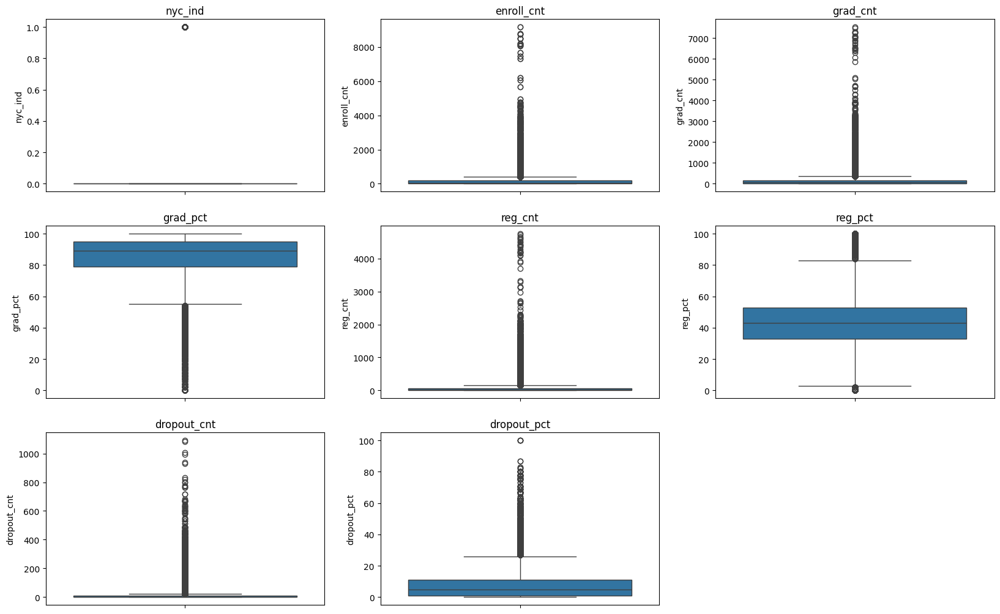

In [25]:
# - Sainath
boxplot(numeric_cols,df)

- Many features (e.g., enroll_cnt, grad_cnt, dropout_cnt) have extreme outliers, indicating significant variability in values across school districts.
- Most distributions are highly skewed towards the lower end, with many values close to zero, which may suggest that a large proportion of subgroups have low counts or percentages.
- The high concentration of values near the lower end with a few extreme outliers suggests that the data might benefit from outlier handling (e.g., capping) or normalization before modeling.

- outliers should be  treated

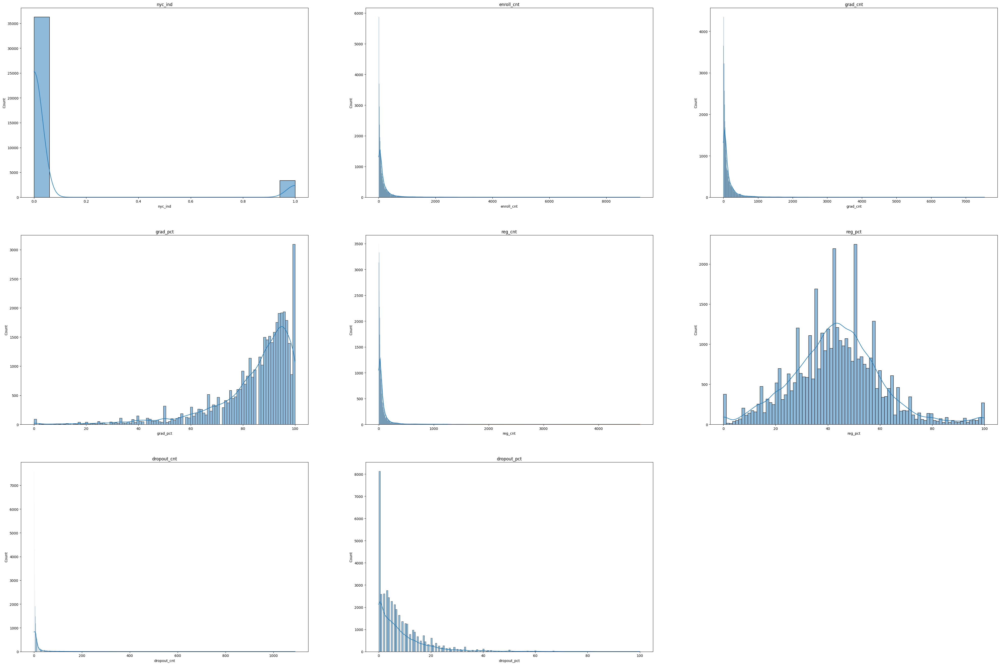

In [26]:
# - Sainath
histplot(numeric_cols,df)

- Most of the features have highly right-skewed distributions, with a large number of data points concentrated near the lower values, indicating an imbalance or sparsity in data for higher values.
- There is a significant long tail for many variables, suggesting the presence of outliers or rare instances with large values.
- Some features, such as grad_pct and reg_pct, exhibit a more even spread, indicating greater variability across their respective ranges compared to other features.

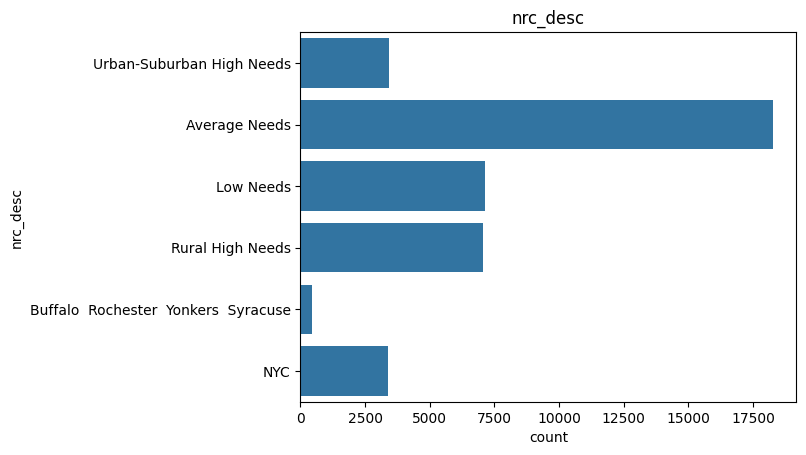

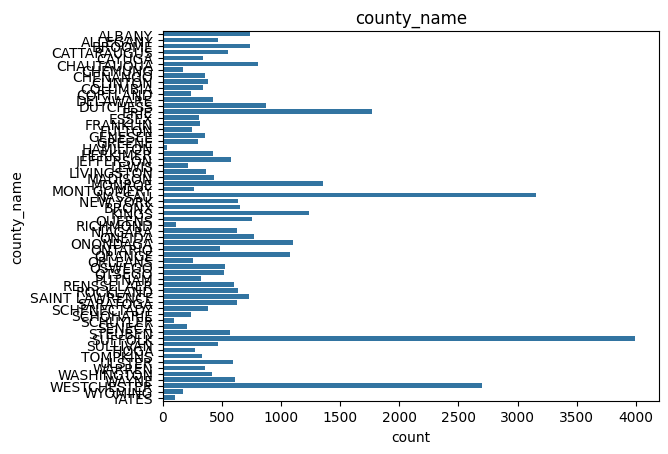

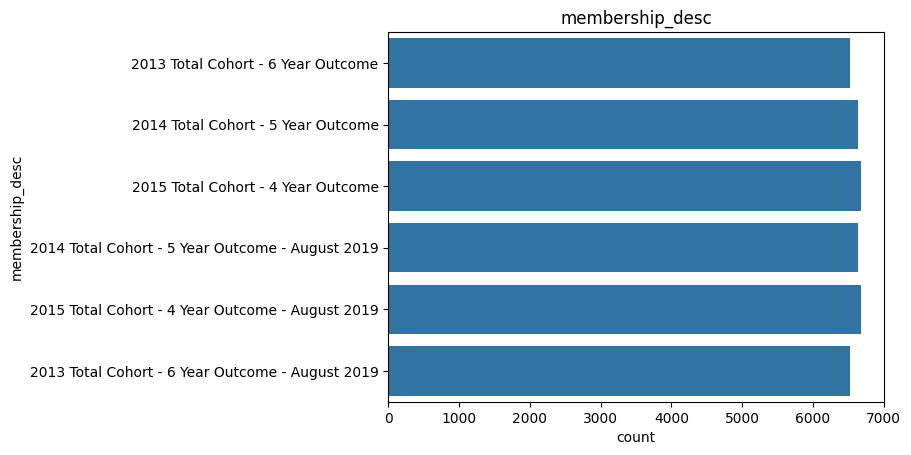

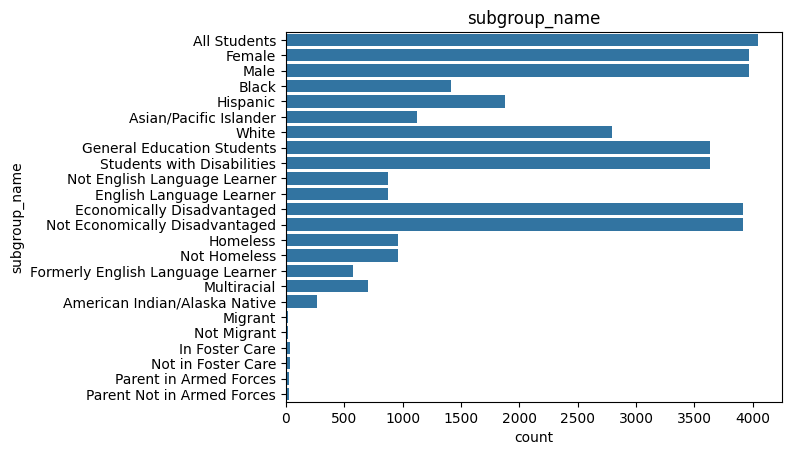

In [27]:
# - Sainath
for col in categorical_cols:
  sns.countplot(df[col])
  plt.title(col)
  plt.show()

- The majority of the observations fall under the "Average Needs" category, followed by "Low Needs" and "Rural High Needs".
- NYC also has a significant number of observations, while specific cities like Buffalo, Rochester, Yonkers, and Syracuse have comparatively fewer.
- This suggests that most school districts have average or low needs, with fewer districts classified as high needs, which could indicate disparities in resources or focus across different regions.

- Westchester and New York counties have the highest counts, indicating that these counties have a significant number of school districts or data entries.
- Several counties, such as Greene, Schuyler, and Hamilton, have considerably fewer counts, suggesting fewer data points or a smaller number of school districts.
- This distribution indicates variability in the number of school districts or student populations across different counties in New York State, with some counties being more represented than others.

- The membership descriptions (cohorts across different years and outcomes) are relatively evenly distributed, each with a count of around 6,000 to 7,000.
- This even distribution suggests consistent data collection across multiple cohort years and time frames, which should provide balanced insights for trend analysis.
- The data seems to cover multiple outcomes over a span of years, which could be useful for examining patterns in graduation or dropout rates over time.

- The "All Students" subgroup has the highest count, followed closely by various demographic categories like "White", "Economically Disadvantaged", and "Female".
- Subgroups such as "American Indian/Alaska Native", "Migrant", and "In Foster Care" have significantly fewer counts, indicating these populations are smaller or underrepresented.
- The distribution suggests a wide range of demographic subgroups, providing a comprehensive breakdown of student characteristics for deeper analysis of disparities in education outcomes.

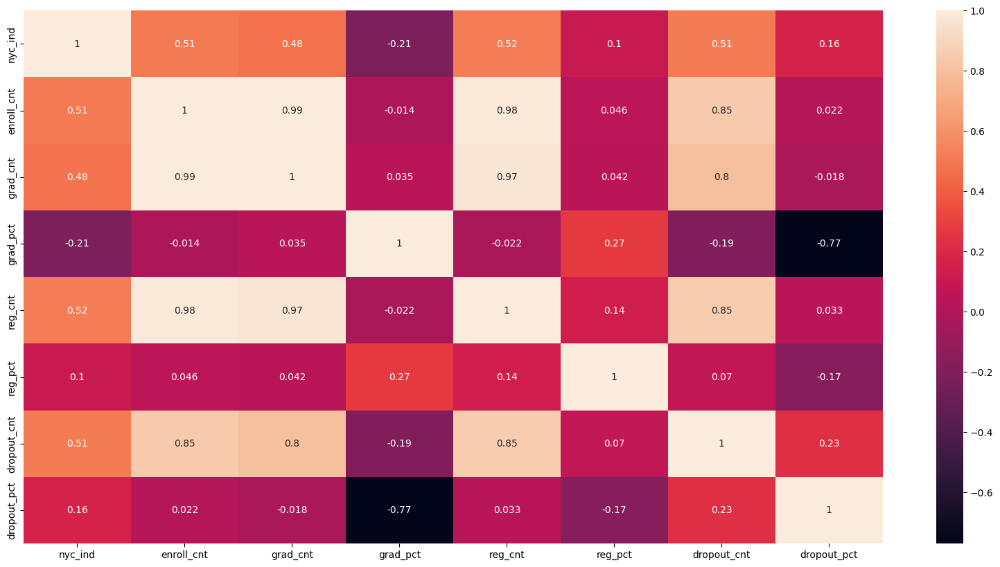

In [28]:
# - Sainath
corr_matrix = df[numeric_cols].corr()
plt.figure(figsize=(20,10))
sns.heatmap(corr_matrix,annot=True)
plt.show()

- There is a strong positive correlation between enroll_cnt, grad_cnt, and dropout_cnt, indicating that higher enrollment tends to result in both higher graduation and dropout counts.
- Grad_pct and dropout_pct have a strong negative correlation (-0.77), suggesting that higher graduation percentages are typically associated with lower dropout percentages.
- Features like reg_cnt, reg_adv_cnt, and still_enr_cnt also show moderate to strong correlations with dropout_cnt, suggesting they might be important predictors for dropout modeling.

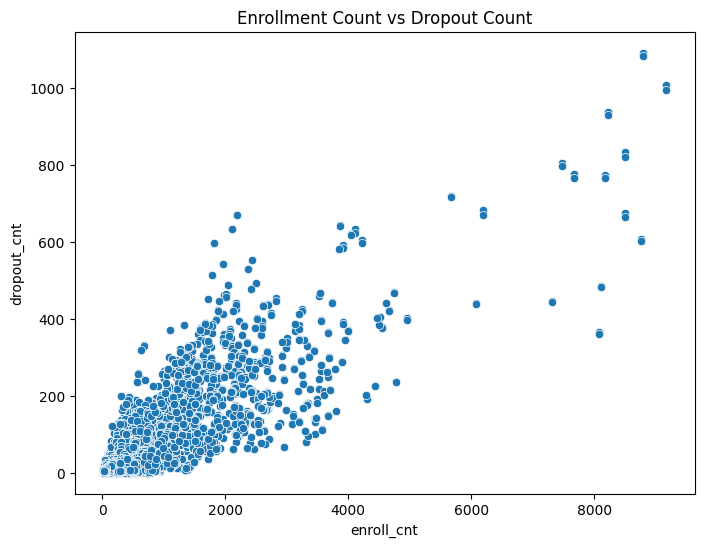

In [29]:
# Scatter plot for enroll_cnt vs dropout_cnt - Sainath
plt.figure(figsize=(8, 6))
sns.scatterplot(x='enroll_cnt', y='dropout_cnt', data=df)
plt.title("Enrollment Count vs Dropout Count")
plt.show()

- There is a positive relationship between enroll_cnt and dropout_cnt, indicating that as enrollment count increases, the dropout count tends to increase as well.
- The data points suggest variability with some high enroll_cnt values leading to notably higher dropout counts, indicating that larger enrollments may face higher challenges in retaining students.
- The general trend supports a linear association, suggesting enroll_cnt is a potential predictor for modeling dropout_cnt.

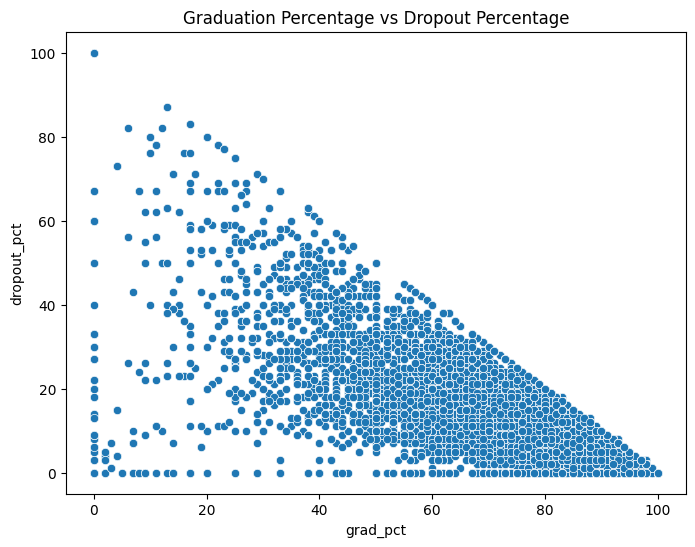

In [30]:
# Scatter plot for grad_pct vs dropout_pct - Sainath
plt.figure(figsize=(8, 6))
sns.scatterplot(x='grad_pct', y='dropout_pct', data=df)
plt.title("Graduation Percentage vs Dropout Percentage")
plt.show()

- There is a negative relationship between grad_pct (graduation percentage) and dropout_pct (dropout percentage), indicating that higher graduation rates are generally associated with lower dropout rates.
- The plot shows a clear triangular pattern, where high graduation percentages correlate with near-zero dropout percentages, while lower graduation rates often align with a wider range of dropout percentages.
- This inverse relationship suggests that focusing on improving graduation rates may help to reduce dropout rates effectively.

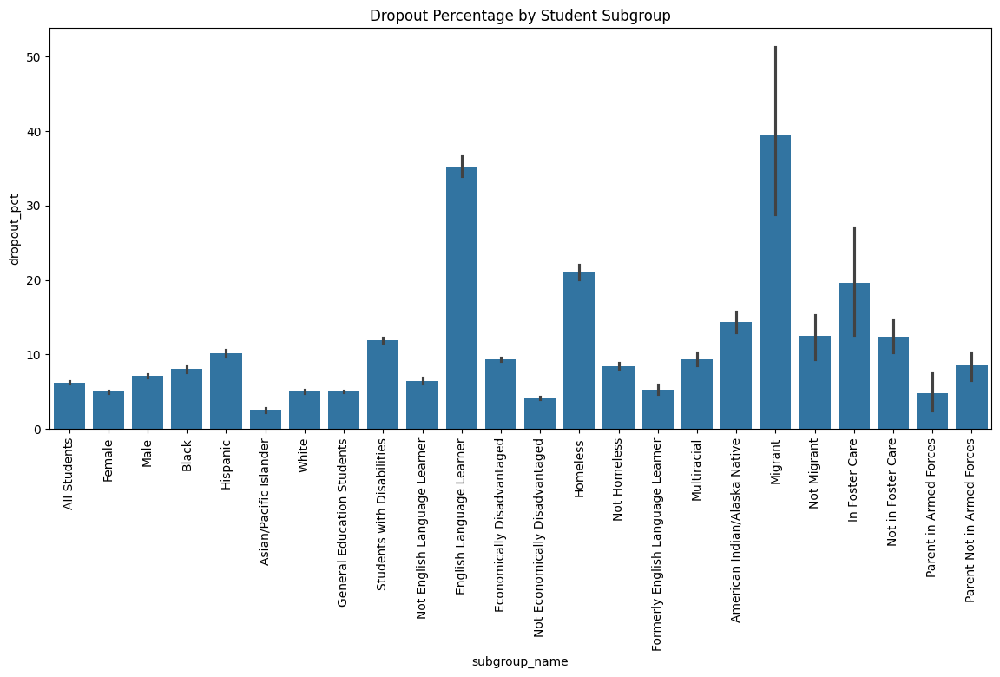

In [31]:
# Boxplot for dropout_pct by subgroup_name - Sainath
plt.figure(figsize=(14, 6))
sns.barplot(x='subgroup_name', y='dropout_pct', data=df)
plt.xticks(rotation=90)
plt.title("Dropout Percentage by Student Subgroup")
plt.show()

- Migrant, Homeless, and English Language Learner subgroups have the highest dropout percentages, suggesting these groups are at a greater risk of dropping out.
- Subgroups like Asian/Pacific Islander and General Education Students have lower dropout rates, indicating potentially better support or fewer barriers to continuing education.
- This variation across subgroups highlights the importance of targeted interventions for specific vulnerable groups to reduce dropout rates.

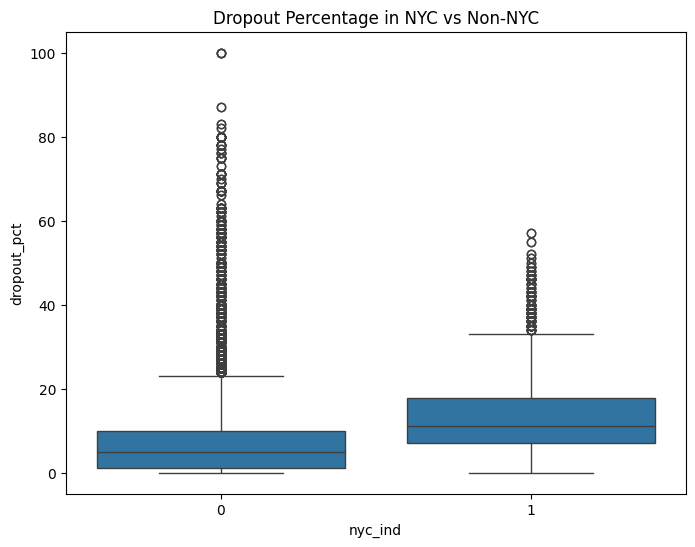

In [32]:
# Boxplot for dropout_pct by nyc_ind (NYC vs Non-NYC) - Sainath
plt.figure(figsize=(8, 6))
sns.boxplot(x='nyc_ind', y='dropout_pct', data=df)
plt.title("Dropout Percentage in NYC vs Non-NYC")
plt.show()

- Non-NYC districts (indicated by 0) have a wider range and higher number of extreme dropout percentages compared to NYC districts (1), as shown by the presence of numerous outliers.
- The median dropout percentage for both NYC and Non-NYC districts is similar, but Non-NYC districts exhibit significantly more variability.

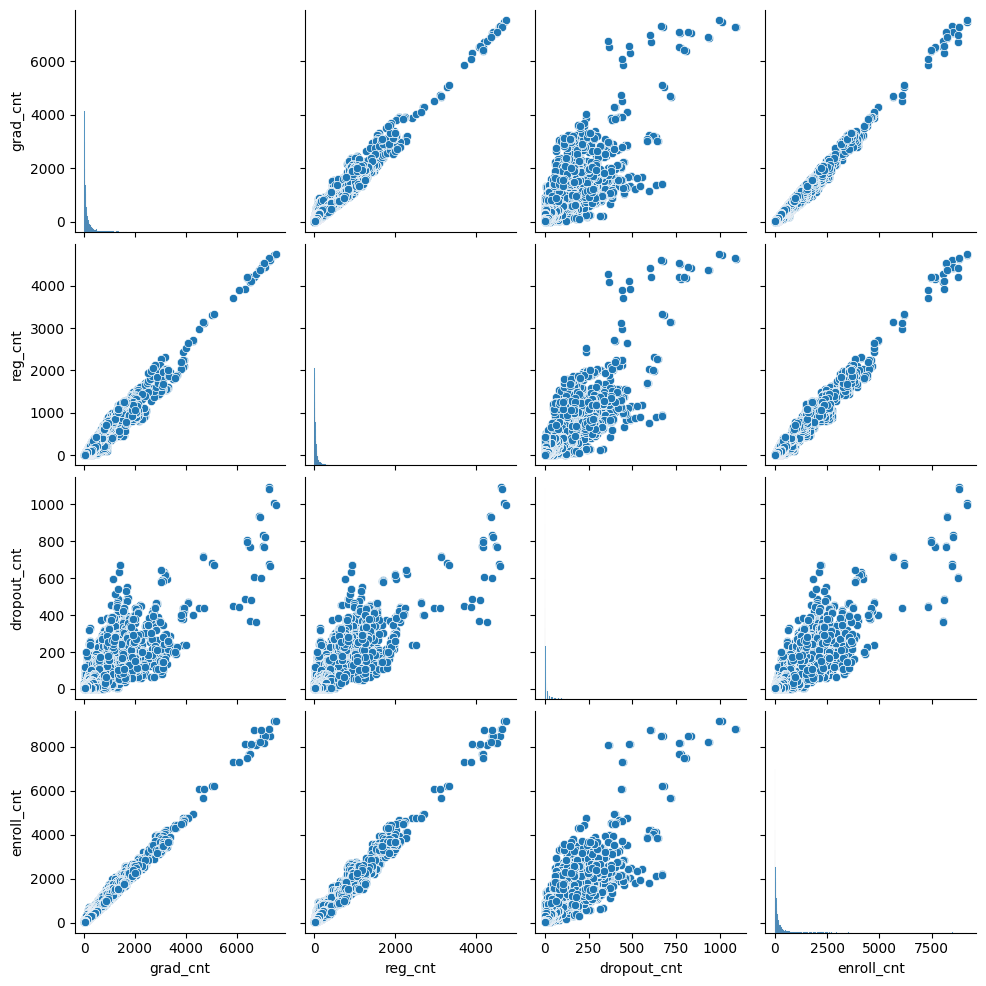

In [33]:
# - Sainath
sns.pairplot(df[count_cols])
plt.show()

- There is a positive linear relationship between features like enroll_cnt, grad_cnt, local_cnt, and dropout_cnt, suggesting these variables increase together.
- Many relationships show strong clustering around low values, indicating that most data points are concentrated in smaller ranges, with a few higher outliers.

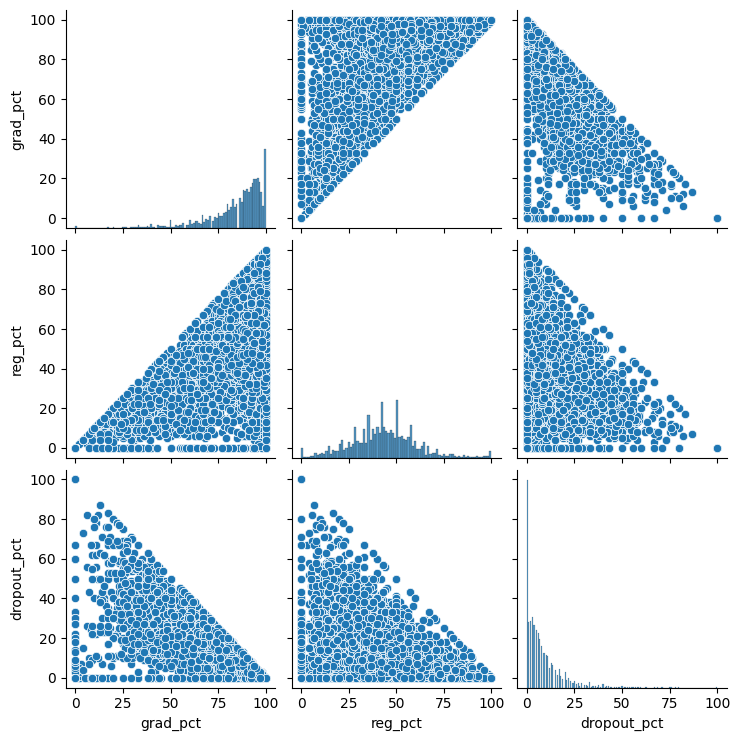

In [34]:
# - Sainath
sns.pairplot(df[percentage_cols])
plt.show()

- There is a negative correlation between grad_pct (graduation percentage) and dropout_pct (dropout percentage), as well as between other graduation-related percentages and dropout percentages, indicating that higher graduation outcomes generally coincide with lower dropout rates.
- Triangular patterns are observed in many scatter plots, suggesting a constraint relationship, where higher values of one variable correspond to lower limits for another.
- The plots show clear negative trends across many features, highlighting the inverse relationships between positive student outcomes (graduation, credential attainment) and dropout rates.

Treating the outliers

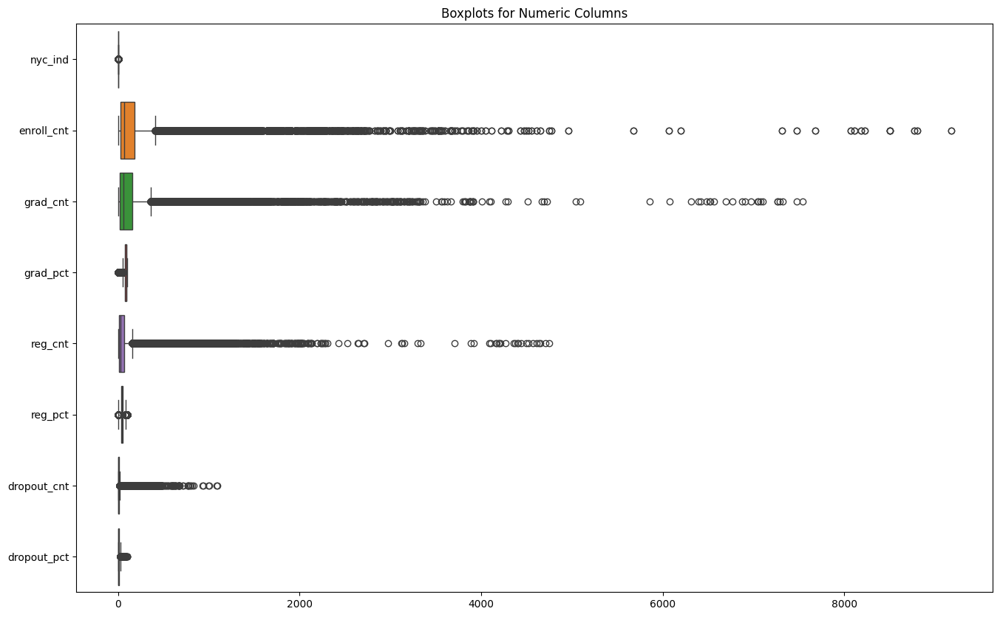

In [35]:
# - Sainath
plt.figure(figsize=(16, 10))
sns.boxplot(data=df[numeric_cols], orient="h")
plt.title("Boxplots for Numeric Columns")
plt.show()

- Many features, including enroll_cnt, grad_cnt, reg_cnt, and dropout_cnt, exhibit a significant number of outliers, as indicated by the numerous data points far beyond the whiskers.
- Most variables have a highly skewed distribution with extreme values, suggesting that these features may require outlier treatment or transformation for better model performance.

In [36]:
# Calculating z_scores - Sainath
z_scores = stats.zscore(df[numeric_cols])

# Finding rows where the Z-score is greater than 3 or less than -3 (outliers)
outliers = (abs(z_scores) > 3).any(axis=1)

In [37]:
# - Sainath
df_outliers = df[outliers]
df_outliers.shape

(5266, 12)

In [38]:
# - Sainath
df.shape

(39674, 12)

In [39]:
# Removing the outliers - Sainath
data = df[~outliers]
data.shape

(34408, 12)

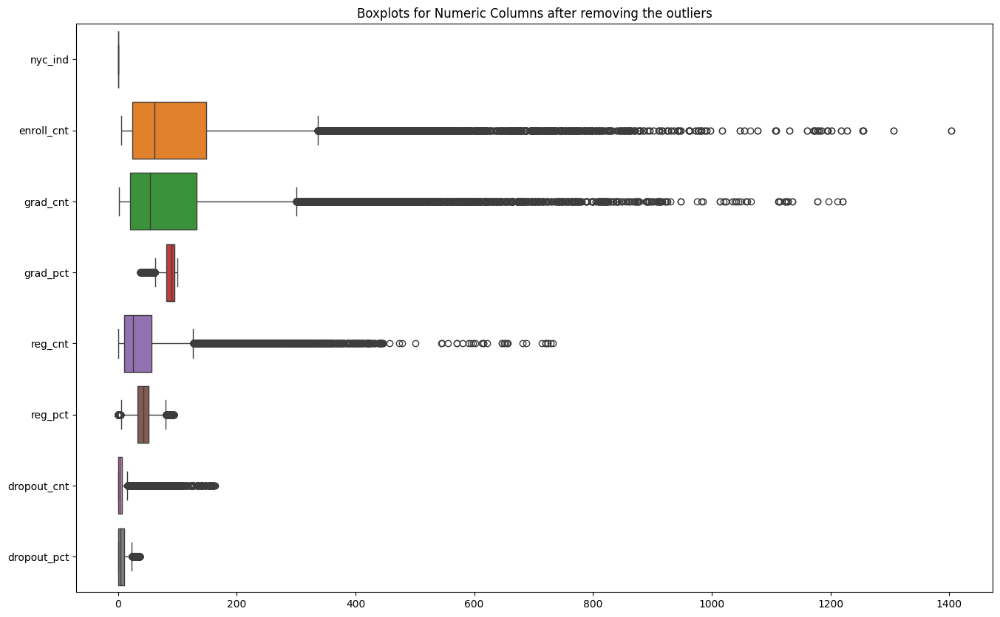

In [40]:
# boxplot after handling the outliers - Sainath
plt.figure(figsize=(16, 10))
sns.boxplot(data=data[numeric_cols], orient="h")
plt.title("Boxplots for Numeric Columns after removing the outliers")
plt.show()

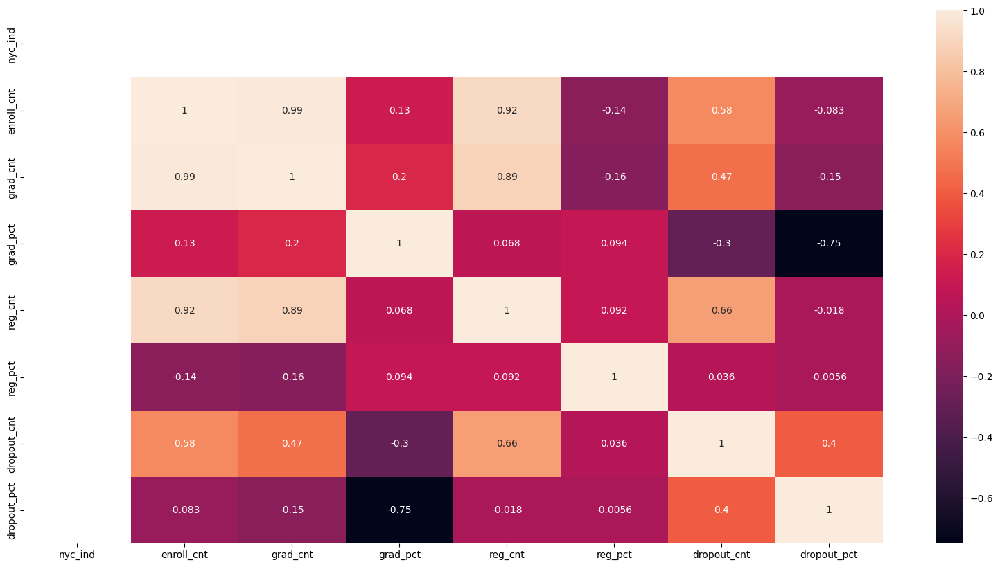

In [41]:
# - Vedant
plt.figure(figsize=(20,10))
sns.heatmap(data[numeric_cols].corr(), annot=True)
plt.show()

- There is a very strong positive correlation between enroll_cnt and grad_cnt (0.99), indicating that enrollment and graduation counts are closely related.
- Dropout percentage (dropout_pct) has a strong negative correlation with grad_pct (-0.82), suggesting that higher graduation percentages are associated with lower dropout rates.
- Many features, such as reg_cnt, grad_cnt, and dropout_cnt, show significant correlations, indicating potential multicollinearity, which could affect model accuracy. Dimensionality reduction or feature selection may be required.

In [42]:
# checking cols with high collinearity - vedant
corr_matrix = data[numeric_cols].corr()

In [43]:
# - vedant
high_corr = corr_matrix[((corr_matrix > 0.89) & (corr_matrix < 1))].stack().index.tolist()
high_corr

[('enroll_cnt', 'grad_cnt'),
 ('enroll_cnt', 'reg_cnt'),
 ('grad_cnt', 'enroll_cnt'),
 ('reg_cnt', 'enroll_cnt')]

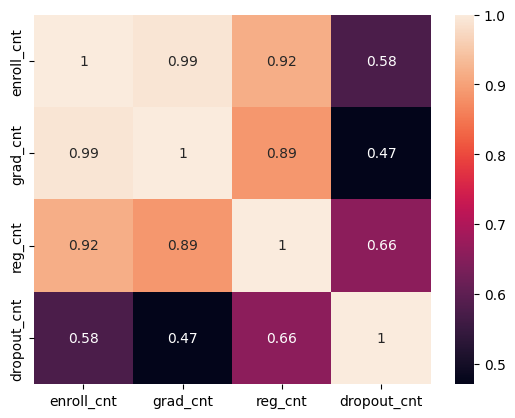

In [44]:
# checking the highly correlated cols with Target col(dropout_cnt) - vedant
sns.heatmap(data[['enroll_cnt','grad_cnt','reg_cnt','dropout_cnt']].corr(), annot=True)
plt.show()

In [45]:
# - vedant
data = data.drop(['grad_cnt'],axis=1)
data.shape

(34408, 11)

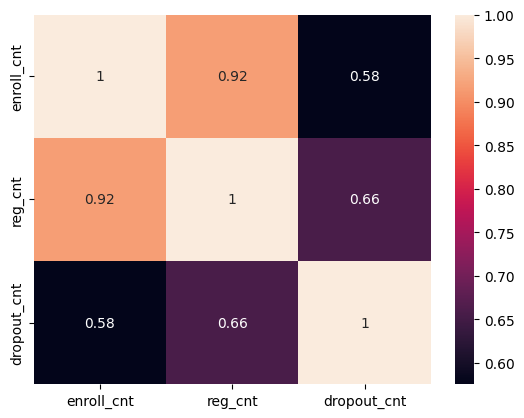

In [46]:
# - vedant
sns.heatmap(data[['enroll_cnt','reg_cnt','dropout_cnt']].corr(), annot=True)
plt.show()

In [47]:
# - vedant
data = data.drop(['reg_cnt'],axis=1)
data.shape

(34408, 10)

In [48]:
# - vedant
numeric_cols = numeric_cols.drop(['grad_cnt','reg_cnt'])

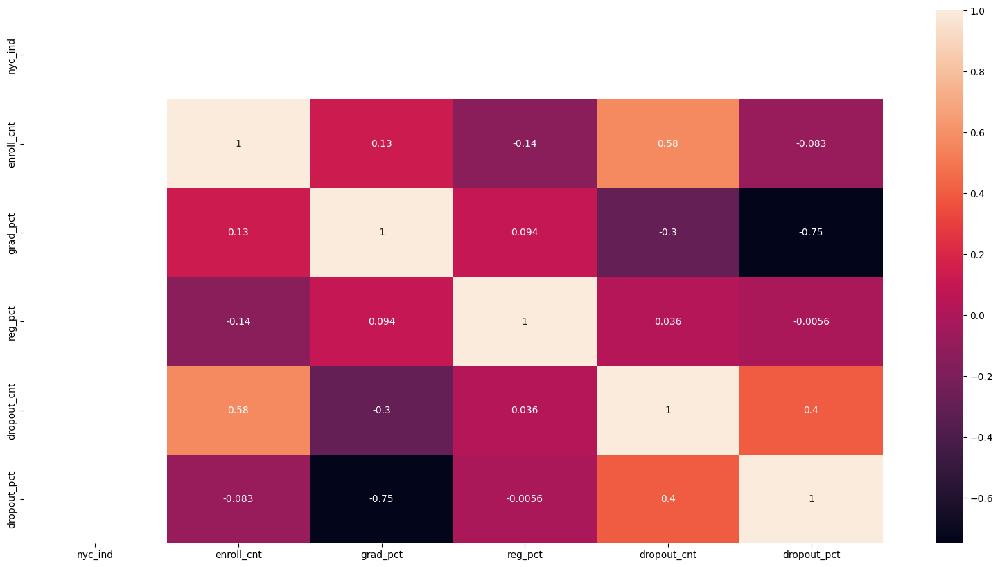

In [49]:
# - vedant
plt.figure(figsize=(20,10))
sns.heatmap(data[numeric_cols].corr(), annot=True)
plt.show()

## Creating `reg_pct_level`

In [50]:
# Calculating thresholds for reg_pct_level
median_reg_pct = data['reg_pct'].median()
low_threshold = 0.5 * median_reg_pct
high_threshold = 1.5 * median_reg_pct

In [51]:
# Creating reg_pct_level
data['reg_pct_level'] = pd.cut(
    data['reg_pct'],
    bins=[-np.inf, low_threshold, high_threshold, np.inf],
    labels=['low', 'medium', 'high']
)


In [52]:
data['reg_pct_level'].value_counts()

,count
reg_pct_level,
medium,28804
low,3000
high,2604


In [53]:
data.columns

Index(['nrc_desc', 'county_name', 'nyc_ind', 'membership_desc',
       'subgroup_name', 'enroll_cnt', 'grad_pct', 'reg_pct', 'dropout_cnt',
       'dropout_pct', 'reg_pct_level'],
      dtype='object')

In [54]:
# Droping reg_pct and reg_cnt
data.drop(columns=['reg_pct'], inplace=True)

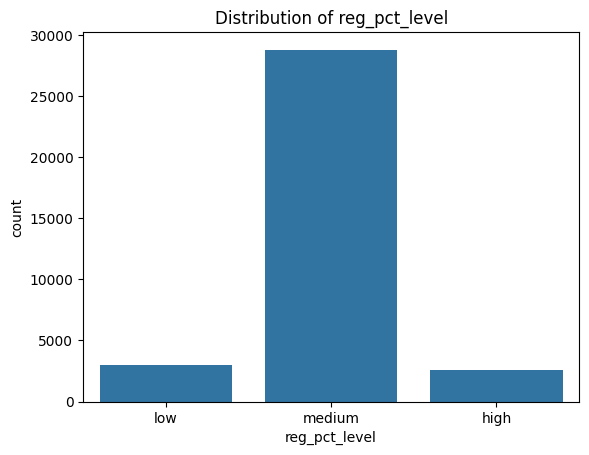

In [55]:
# Visualizing distribution of reg_pct_level
sns.countplot(x='reg_pct_level', data=data)
plt.title('Distribution of reg_pct_level')
plt.show()

creating dummies

In [56]:
data[categorical_cols].nunique()

,0
nrc_desc,5
county_name,57
membership_desc,6
subgroup_name,24


In [57]:
# creating dummy variables for catogrical cols - meher
data_coded = pd.get_dummies(data, columns=categorical_cols, drop_first=True)
data_coded.shape

(34408, 94)

In [58]:
# - meher
data_coded.head()

,nyc_ind,enroll_cnt,grad_pct,dropout_cnt,dropout_pct,reg_pct_level,nrc_desc_Buffalo Rochester Yonkers Syracuse,nrc_desc_Low Needs,nrc_desc_Rural High Needs,nrc_desc_Urban-Suburban High Needs,...,subgroup_name_Multiracial,subgroup_name_Not Economically Disadvantaged,subgroup_name_Not English Language Learner,subgroup_name_Not Homeless,subgroup_name_Not Migrant,subgroup_name_Not in Foster Care,subgroup_name_Parent Not in Armed Forces,subgroup_name_Parent in Armed Forces,subgroup_name_Students with Disabilities,subgroup_name_White
0,0,658,71,148,22,medium,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
1,0,324,76,65,20,medium,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
2,0,334,65,83,25,medium,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
4,0,367,68,91,25,medium,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
5,0,98,59,28,29,medium,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False


In [59]:
# - meher
data_coded.describe().T

,count,mean,std,min,25%,50%,75%,max
nyc_ind,34408.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
enroll_cnt,34408.0,117.949111,150.062384,5.0,24.0,61.0,149.0,1403.0
grad_pct,34408.0,87.067106,11.624588,38.0,82.0,90.0,95.0,100.0
dropout_cnt,34408.0,6.781301,13.723337,0.0,1.0,3.0,7.0,163.0
dropout_pct,34408.0,6.487038,6.994345,0.0,1.0,4.0,10.0,36.0


In [60]:
data_coded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 34408 entries, 0 to 73146
Data columns (total 94 columns):
 #   Column                                                            Non-Null Count  Dtype   
---  ------                                                            --------------  -----   
 0   nyc_ind                                                           34408 non-null  int64   
 1   enroll_cnt                                                        34408 non-null  int64   
 2   grad_pct                                                          34408 non-null  int64   
 3   dropout_cnt                                                       34408 non-null  int64   
 4   dropout_pct                                                       34408 non-null  int64   
 5   reg_pct_level                                                     34408 non-null  category
 6   nrc_desc_Buffalo  Rochester  Yonkers  Syracuse                    34408 non-null  bool    
 7   nrc_desc_Low Needs         

# Model

## Feature selection and spliting data

In [61]:
X = data_coded.drop('reg_pct_level', axis=1)
y = data_coded['reg_pct_level']

In [62]:
# min_max
scaler = MinMaxScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
X.head()

,nyc_ind,enroll_cnt,grad_pct,dropout_cnt,dropout_pct,nrc_desc_Buffalo Rochester Yonkers Syracuse,nrc_desc_Low Needs,nrc_desc_Rural High Needs,nrc_desc_Urban-Suburban High Needs,county_name_ALLEGANY,...,subgroup_name_Multiracial,subgroup_name_Not Economically Disadvantaged,subgroup_name_Not English Language Learner,subgroup_name_Not Homeless,subgroup_name_Not Migrant,subgroup_name_Not in Foster Care,subgroup_name_Parent Not in Armed Forces,subgroup_name_Parent in Armed Forces,subgroup_name_Students with Disabilities,subgroup_name_White
0,0.0,0.467096,0.532258,0.907975,0.611111,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.228183,0.612903,0.398773,0.555556,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.235336,0.435484,0.509202,0.694444,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.258941,0.483871,0.558282,0.694444,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.066524,0.338710,0.171779,0.805556,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [63]:
selector = SelectKBest(score_func=mutual_info_classif)
X_new = selector.fit_transform(X, y)

In [64]:
# Displaying selected features
selected_features = X.columns[selector.get_support()]
print("Selected Features:", selected_features)

Selected Features: Index(['enroll_cnt', 'grad_pct', 'dropout_cnt', 'dropout_pct',
       'nrc_desc_Low Needs', 'county_name_NASSAU', 'county_name_WESTCHESTER',
       'subgroup_name_Asian/Pacific Islander',
       'subgroup_name_Formerly English Language Learner',
       'subgroup_name_Students with Disabilities'],
      dtype='object')


In [65]:
X_new.shape

(34408, 10)

split_data

In [66]:
X_train, X_test, y_train, y_test = train_test_split(X_new, y, test_size=0.2, random_state=42)

## **Decision Trees**

In [67]:
# Decision Tree Model 1
dt1 = DecisionTreeClassifier(max_depth=5, random_state=42)
dt1.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5, random_state=42)

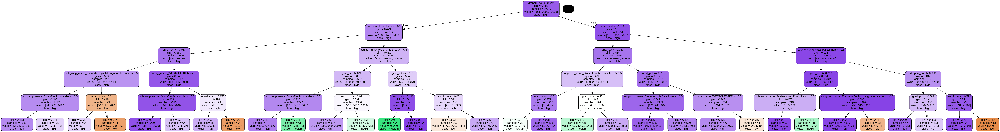

In [68]:
# Plot Decision Tree
dot_data = StringIO()

export_graphviz(dt1, out_file=dot_data, filled=True, rounded=True,
                feature_names=selected_features,
                class_names=['low', 'medium', 'high'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [69]:
# Decision Tree Model 2
dt2 = DecisionTreeClassifier(min_samples_split=10, random_state=42)
dt2.fit(X_train, y_train)

DecisionTreeClassifier(min_samples_split=10, random_state=42)

In [70]:
# Plot Decision Tree
dot_data = StringIO()

export_graphviz(dt2, out_file=dot_data, filled=True, rounded=True,
                feature_names=selected_features,
                class_names=['low', 'medium', 'high'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.317304 to fit



In [71]:
# Evaluating Decision Trees
for model, name in zip([dt1, dt2], ['DT1', 'DT2']):
    y_pred = model.predict(X_test)
    print(f"Results for {name}:")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))

Results for DT1:
[[  58    1  450]
 [   9  195  398]
 [  43  127 5601]]
              precision    recall  f1-score   support

        high       0.53      0.11      0.19       509
         low       0.60      0.32      0.42       602
      medium       0.87      0.97      0.92      5771

    accuracy                           0.85      6882
   macro avg       0.67      0.47      0.51      6882
weighted avg       0.82      0.85      0.82      6882

Results for DT2:
[[ 159   15  335]
 [  17  349  236]
 [ 153  197 5421]]
              precision    recall  f1-score   support

        high       0.48      0.31      0.38       509
         low       0.62      0.58      0.60       602
      medium       0.90      0.94      0.92      5771

    accuracy                           0.86      6882
   macro avg       0.67      0.61      0.63      6882
weighted avg       0.85      0.86      0.85      6882



## **Random Forest**

In [72]:
# Random Forest Model 1
rf1 = RandomForestClassifier(n_estimators=100, max_depth=5, random_state=42)
rf1.fit(X_train, y_train)

RandomForestClassifier(max_depth=5, random_state=42)

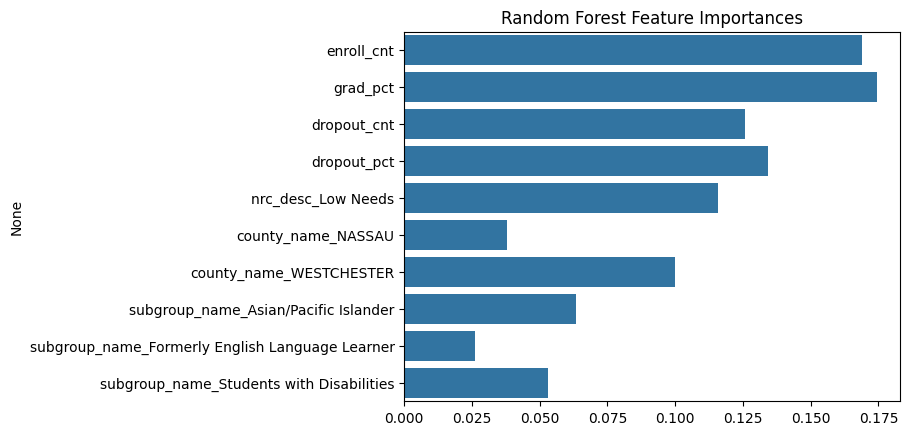

In [73]:
# Feature Importances (Random Forest)
rf_importances = rf1.feature_importances_
sns.barplot(x=rf_importances, y=selected_features)
plt.title('Random Forest Feature Importances')
plt.show()

In [74]:
# Random Forest Model 2
rf2 = RandomForestClassifier(n_estimators=200, max_features='sqrt', random_state=42)
rf2.fit(X_train, y_train)

RandomForestClassifier(n_estimators=200, random_state=42)

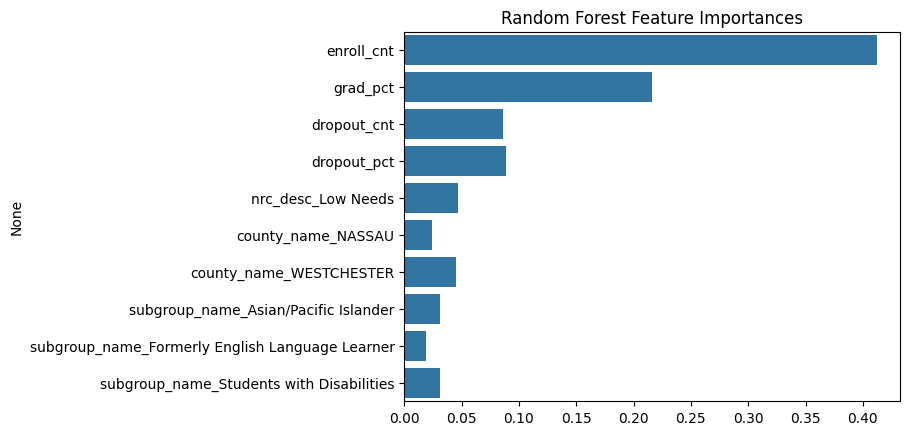

In [75]:
# Feature Importances (Random Forest)
rf_importances = rf2.feature_importances_
sns.barplot(x=rf_importances, y=selected_features)
plt.title('Random Forest Feature Importances')
plt.show()

In [76]:
# Evaluating Random Forests
for model, name in zip([rf1, rf2], ['RF1', 'RF2']):
    y_pred = model.predict(X_test)
    print(f"Results for {name}:")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))

Results for RF1:
[[   0    0  509]
 [   0   87  515]
 [   0   14 5757]]
              precision    recall  f1-score   support

        high       0.00      0.00      0.00       509
         low       0.86      0.14      0.25       602
      medium       0.85      1.00      0.92      5771

    accuracy                           0.85      6882
   macro avg       0.57      0.38      0.39      6882
weighted avg       0.79      0.85      0.79      6882

Results for RF2:
[[ 194   12  303]
 [   9  365  228]
 [  90  111 5570]]
              precision    recall  f1-score   support

        high       0.66      0.38      0.48       509
         low       0.75      0.61      0.67       602
      medium       0.91      0.97      0.94      5771

    accuracy                           0.89      6882
   macro avg       0.77      0.65      0.70      6882
weighted avg       0.88      0.89      0.88      6882



## **Comparing Models**

In [77]:
# Cross-Validation Scores
models = [dt1, dt2, rf1, rf2]
model_names = ['DT1', 'DT2', 'RF1', 'RF2']

for model, name in zip(models, model_names):
    cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='accuracy')
    print(f"{name} Cross-Validation Accuracy: {np.mean(cv_scores):.3f}")

DT1 Cross-Validation Accuracy: 0.847
DT2 Cross-Validation Accuracy: 0.851
RF1 Cross-Validation Accuracy: 0.846
RF2 Cross-Validation Accuracy: 0.882


# Conclusion

In this project, we compared decision tree and random forest models to classify New York State high school graduation data, focusing on handling class imbalance. While decision trees provided interpretable results with consistent accuracy (0.847), they struggled with minority class classification. Random forests demonstrated superior performance, with RF2 achieving the highest cross-validation accuracy (0.879) and a balanced classification across all categories. This highlights the trade-off between simplicity and performance, with RF2 emerging as the optimal model for its ability to handle complex, imbalanced datasets effectively.